# Third trimester preprocessing 

Import packages:

In [1]:
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np

In [2]:
adata = ad.read_h5ad('./yang_unprocessed.h5ad') 

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [3]:
adata.var_names_make_unique()

In [4]:
subset_ids = ["SAMN18844857", "SAMN18844863"]
adata = adata[adata.obs['BioSample'].isin(subset_ids)].copy()

In [5]:
print(adata.obs['BioSample'].unique())

['SAMN18844857', 'SAMN18844863']
Categories (2, object): ['SAMN18844857', 'SAMN18844863']


In [6]:
adata

AnnData object with n_obs × n_vars = 48234 × 36601
    obs: 'Author', 'BioSample', 'Run', 'Tissue'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

#### Quality control:

In [7]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")

In [8]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], inplace=True, log1p=True
)

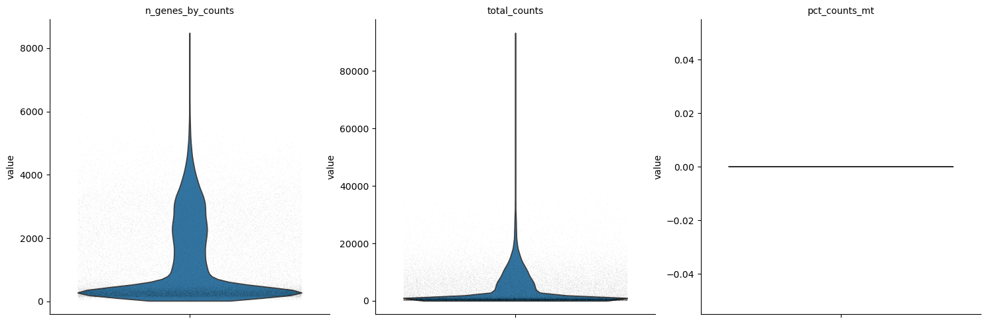

In [9]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4, size=0.1,
    multi_panel=True,
)

In [10]:
adata

AnnData object with n_obs × n_vars = 48234 × 36601
    obs: 'Author', 'BioSample', 'Run', 'Tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [11]:
sc.pp.filter_cells(adata, min_genes=500)

In [12]:
sc.pp.filter_genes(adata, min_cells=3)

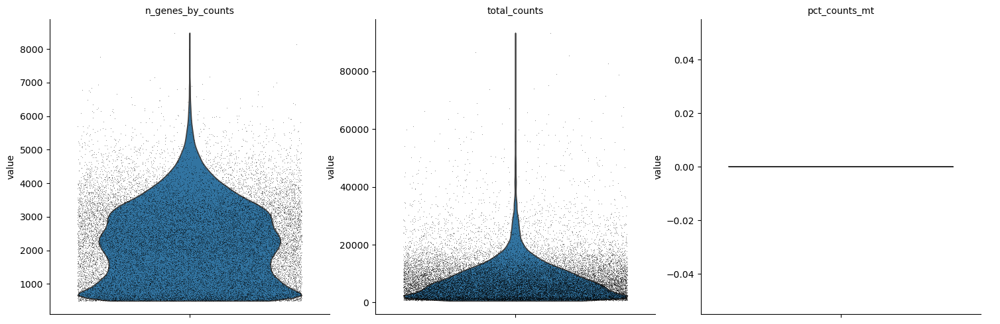

In [13]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4, size=0.4,
    multi_panel=True,
)

#### Doublet removal:

In [14]:
sc.pp.scrublet(adata, batch_key="BioSample")

In [15]:
# Find the number of predicted doublets
num_predicted_doublets = (adata.obs['predicted_doublet'] == True).sum()
print(f"Number of predicted doublets: {num_predicted_doublets}")

Number of predicted doublets: 82


In [16]:
adata.shape

(26491, 24587)

In [17]:
adata = adata[adata.obs["predicted_doublet"] == False, :] 

In [18]:
adata

View of AnnData object with n_obs × n_vars = 26409 × 24587
    obs: 'Author', 'BioSample', 'Run', 'Tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

#### Normalisation: 

In [19]:
# Saving count data
adata.layers["counts"] = adata.X.copy()

/tmp/ipykernel_183520/2262359327.py:2: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  adata.layers["counts"] = adata.X.copy()


In [20]:
# Normalizing to median total counts
sc.pp.normalize_total(adata)

In [21]:
# Logarithmize the data
sc.pp.log1p(adata)

#### Highly variable genes:

Calculate HVGs but no feature selection to ensure all mitochondrial genes may be analysed

In [22]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="BioSample")

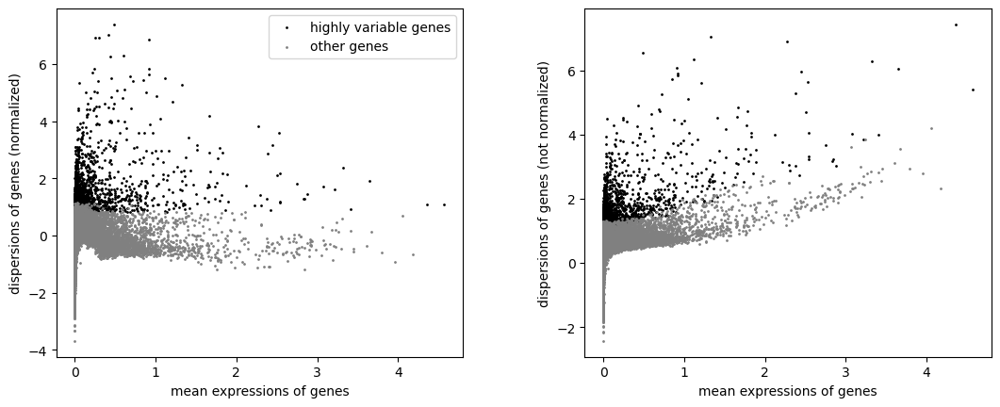

In [23]:
sc.pl.highly_variable_genes(adata)

#### Dimensionality reduction:

In [24]:
sc.tl.pca(adata)

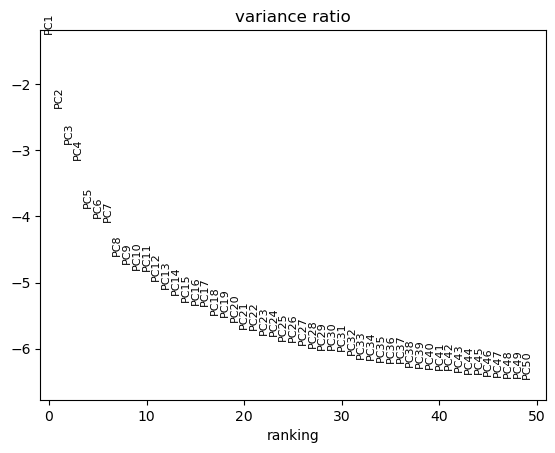

In [25]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

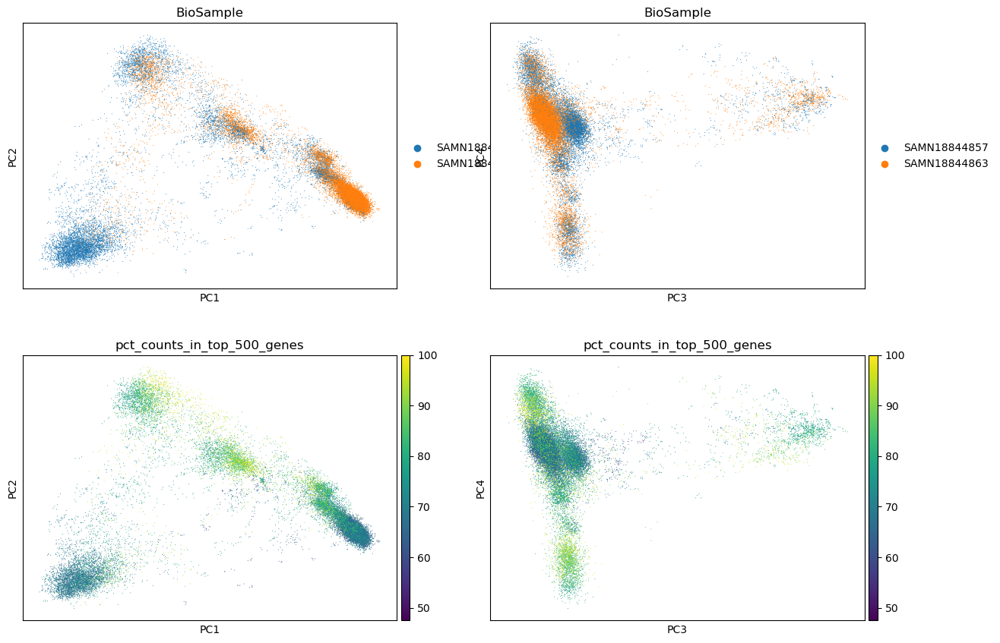

In [26]:
sc.pl.pca(
    adata,
    color=["BioSample", "BioSample", "pct_counts_in_top_500_genes", "pct_counts_in_top_500_genes"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=2,
)

#### Batch correction:

In [27]:
import scanpy.external as sce

In [28]:
sce.pp.harmony_integrate(adata, key='BioSample')

2025-06-24 12:37:41,318 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-06-24 12:37:43,791 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-06-24 12:37:43,873 - harmonypy - INFO - Iteration 1 of 10
2025-06-24 12:37:48,946 - harmonypy - INFO - Iteration 2 of 10
2025-06-24 12:37:54,104 - harmonypy - INFO - Iteration 3 of 10
2025-06-24 12:37:59,488 - harmonypy - INFO - Converged after 3 iterations


In [29]:
'X_pca_harmony' in adata.obsm

True

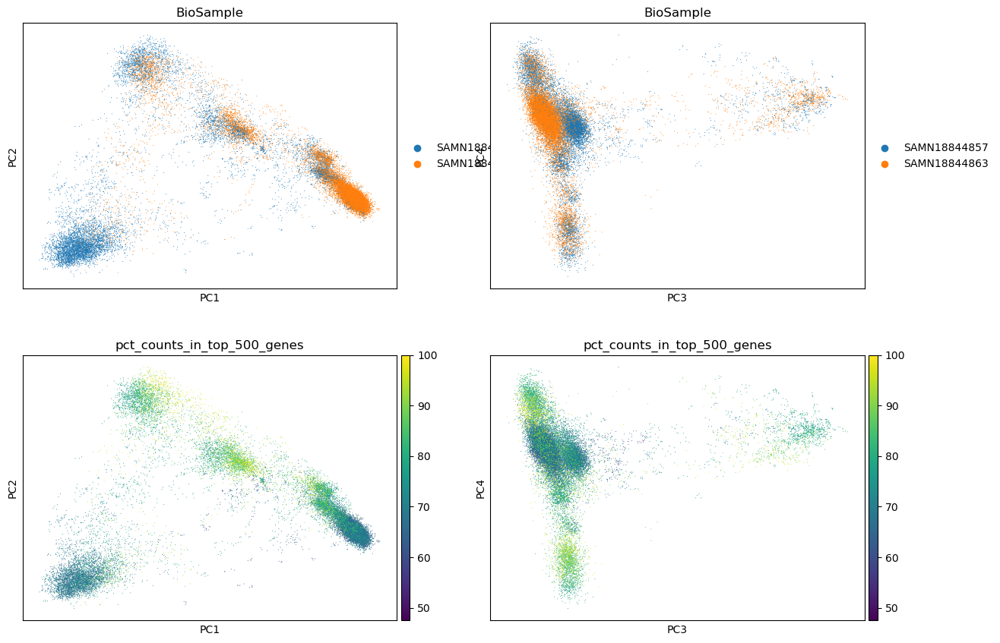

In [30]:
sc.pl.pca(
    adata,
    color=["BioSample", "BioSample", "pct_counts_in_top_500_genes", "pct_counts_in_top_500_genes"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=2,
)

#### Compute neighborhood graph:

In [31]:
sc.pp.neighbors(adata, use_rep="X_pca_harmony")

In [32]:
sc.tl.umap(adata)

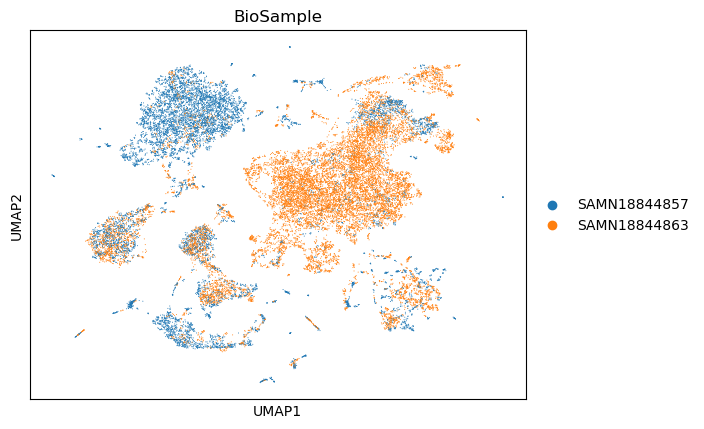

In [33]:
sc.pl.umap(
    adata,
    color="BioSample",
    size=2,
)

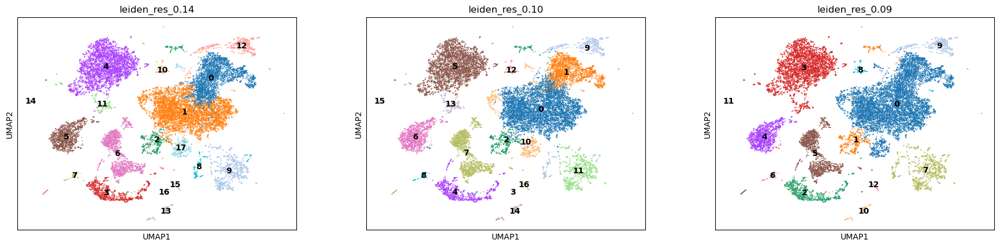

In [34]:
for res in [0.14, 0.10, 0.09]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )
    
sc.pl.umap(
    adata,
    color=["leiden_res_0.14", "leiden_res_0.10", "leiden_res_0.09"],
    legend_loc="on data",
)

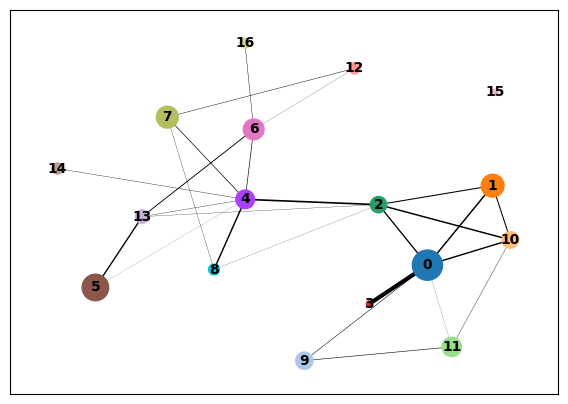

In [35]:
sc.tl.paga(adata, groups='leiden_res_0.10')
sc.pl.paga(adata, plot=True)

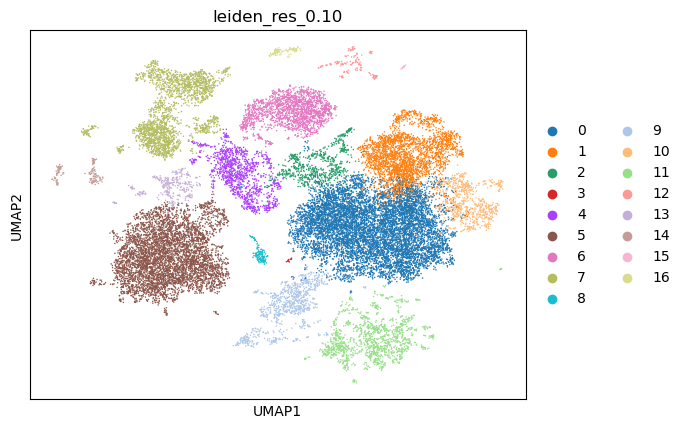

In [36]:
sc.tl.umap(adata, min_dist=0.7, spread=0.8, init_pos='paga')
sc.pl.umap(adata, color='leiden_res_0.10')

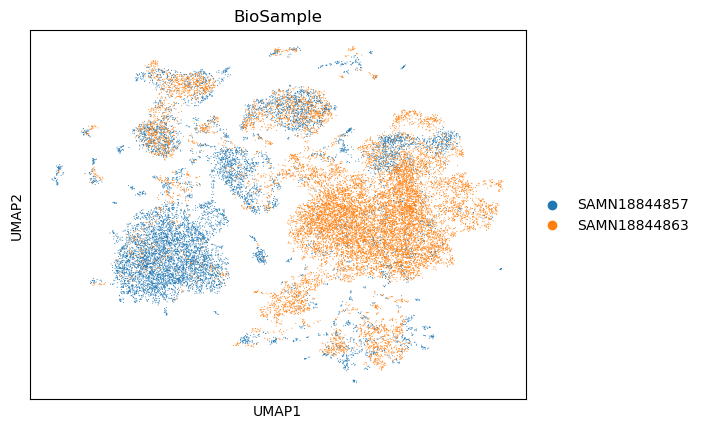

In [37]:
sc.pl.umap(
    adata,
    color="BioSample",
    size=2,
)

In [39]:
adata.write('yang_24.06.h5ad')

#### Cell type annotation

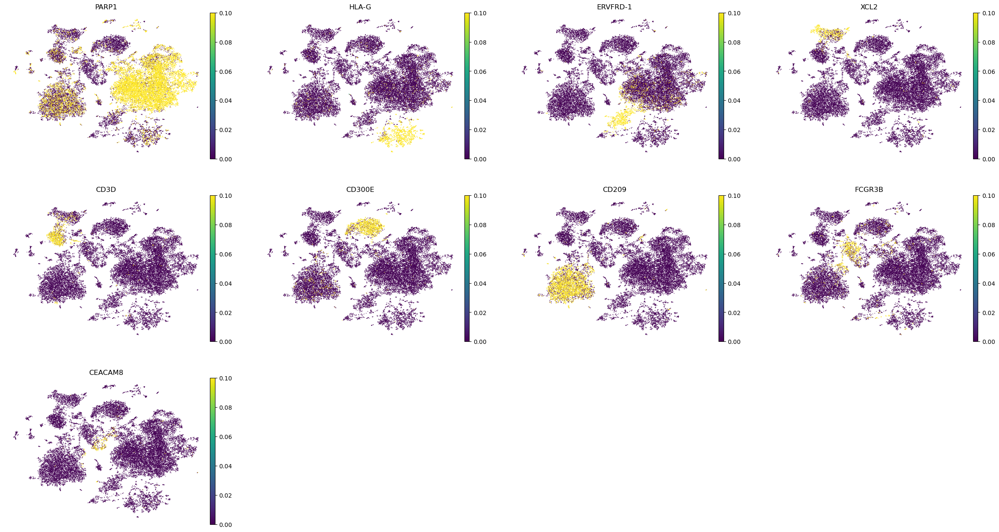

In [38]:
sc.pl.umap(adata, color = ['PARP1', # CTB
                           'HLA-G', # CTB
                           'ERVFRD-1', # STB
                           'XCL2', # NK
                           'CD3D', # TCELL
                           'CD300E', # Monocytes
                           'CD209', # Macrophages
                           'FCGR3B', # Granulocyte
                           'CEACAM8' # Myelocyte
                          ], frameon = False, vmax = 0.1)

In [40]:
# rank marker genes for each Leiden cluster
sc.tl.rank_genes_groups(adata, groupby="leiden_res_0.10", method="wilcoxon", key_added="wilcoxon")

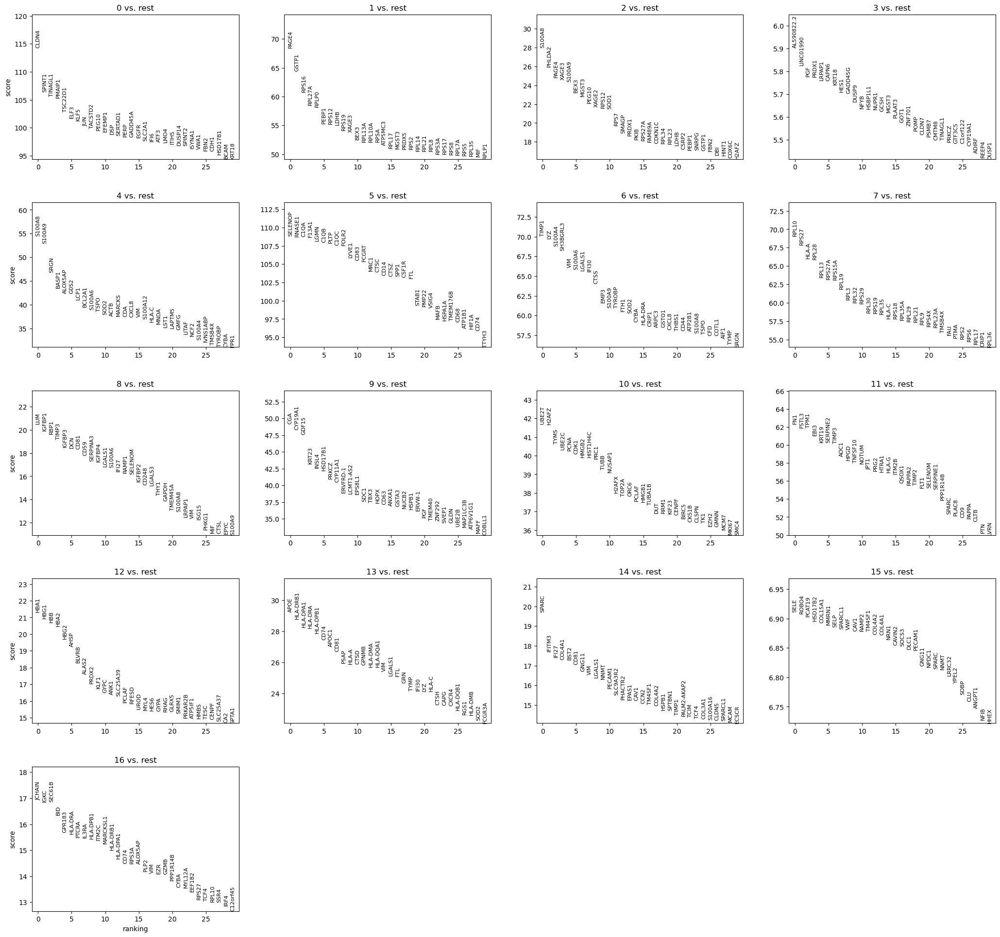

In [41]:
sc.pl.rank_genes_groups(adata, n_genes=30, sharey=False, key="wilcoxon")

In [42]:
# save marker genes for each cluster to a CSV file:

result = adata.uns['wilcoxon']
groups = result['names'].dtype.names # Get Leiden cluster names
# Create a DataFrame with marker gene names, p-values, and log fold changes
adata_genes= pd.DataFrame(
    {group +'_' +key[:1]:result[key][group]
     for group in groups for key in ['names', 'pvals', 'logfoldchanges']})

adata_genes.head()

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,...,13_l,14_n,14_p,14_l,15_n,15_p,15_l,16_n,16_p,16_l
0,CLDN4,0.0,3.943176,PAGE4,0.0,3.858279,S100A8,4.534451e-172,3.402840,AL590822.2,...,8.862772,SPARC,1.408433e-86,6.050765,SELE,4.800857e-12,10.404542,JCHAIN,2.468487e-64,12.577988
1,SPINT1,0.0,3.458355,GSTP1,0.0,2.028314,PHLDA2,1.337465e-148,2.500457,LINC01990,...,5.602592,IFITM3,3.506737e-70,3.633479,ROBO4,4.901810e-12,9.002165,IGKC,7.463951e-64,10.700808
2,TINAGL1,0.0,3.459265,RPS16,0.0,1.141767,PAGE4,3.052431e-136,3.068315,PGF,...,5.449385,IFI27,4.840616e-68,6.410161,PCAT19,5.058323e-12,9.056624,SEC61B,7.913291e-64,3.569753
3,PMAIP1,0.0,3.417500,RPL27A,0.0,1.265977,XAGE3,1.468811e-133,2.255135,PRDX1,...,5.592633,COL4A1,4.669996e-67,4.497412,HSD17B2,5.345322e-12,8.697357,BID,3.772566e-60,5.092524
4,TSC22D1,0.0,3.079472,RPLP0,0.0,1.406862,S100A9,1.998814e-131,2.189383,LRPAP1,...,5.409769,BST2,5.959116e-67,4.056645,COL15A1,5.477664e-12,8.667606,GPR183,2.018393e-55,5.240673


In [43]:
adata_genes.to_csv('./yang.24.06.markergenes.csv')

In [44]:
# Define a function to map genes to cell types; uses Protein Atlas dataset to search for each marker gene and retrieve the top 3 cell types the gene is highly expressed in (based on nTPM values)
def gene_lookup(input_df, search_df):
    '''
    input_df: pandas dataframe with columns of different clusters, and rows containing gene names
    search_df: pandas dataframe containing the 'rna_single_cell_type_tissue.tsv' from human protein atlas (create a subset by tissue type)
    '''
    
    input_clusters = input_df.columns.tolist()
    output = []
    for cluster in input_clusters:  
        for gene in input_df[cluster].tolist():
            try:
                search = search_df[search_df['Gene name'] == gene].nlargest(3,'nTPM')
                output.append([cluster, gene, search['Cell type'].iloc[0],search['nTPM'].iloc[0],search['Cell type'].iloc[1],search['nTPM'].iloc[1],search['Cell type'].iloc[2],search['nTPM'].iloc[2]])
            except IndexError:
                output.append([cluster, gene, 'error', 'error', 'error', 'error', 'error', 'error'])
    return pd.DataFrame(output, columns = ['Cluster_Name', 'Gene_Name', 'Cell_Type_1', 'nTPM_1', 'Cell_Type_2', 'nTPM_2', 'Cell_Type_3', 'nTPM_3'])

In [45]:
# Load the Protein Atlas data
df = pd.read_csv('./rna_single_cell_type_tissue.tsv', sep='\t')
placenta_df = df[df['Tissue'] == 'placenta'].copy() # create a dataframe of genes where the Tissue type is 'placenta'
df = None
placenta_df.head()

,Gene,Gene name,Tissue,Cluster,Cell type,Read count,nTPM
86,ENSG00000000003,TSPAN6,placenta,c-0,cytotrophoblasts,1254,25.7
87,ENSG00000000003,TSPAN6,placenta,c-1,smooth muscle cells,857,54.3
88,ENSG00000000003,TSPAN6,placenta,c-2,extravillous trophoblasts,1624,48.7
89,ENSG00000000003,TSPAN6,placenta,c-3,cytotrophoblasts,882,33.3
90,ENSG00000000003,TSPAN6,placenta,c-4,hofbauer cells,33,2.7


In [46]:
 # Load the marker gene data into a pandas DataFrame
gene_to_cell_type_annotations = pd.read_csv('./yang.24.06.markergenes.csv',index_col=0)
gene_to_cell_type_annotations.head()

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,...,13_l,14_n,14_p,14_l,15_n,15_p,15_l,16_n,16_p,16_l
0,CLDN4,0.0,3.943176,PAGE4,0.0,3.858279,S100A8,4.534451e-172,3.402840,AL590822.2,...,8.862772,SPARC,1.408433e-86,6.050765,SELE,4.800857e-12,10.404542,JCHAIN,2.468487e-64,12.577988
1,SPINT1,0.0,3.458355,GSTP1,0.0,2.028314,PHLDA2,1.337465e-148,2.500457,LINC01990,...,5.602591,IFITM3,3.506737e-70,3.633479,ROBO4,4.901810e-12,9.002165,IGKC,7.463951e-64,10.700808
2,TINAGL1,0.0,3.459265,RPS16,0.0,1.141767,PAGE4,3.052431e-136,3.068315,PGF,...,5.449385,IFI27,4.840616e-68,6.410162,PCAT19,5.058323e-12,9.056624,SEC61B,7.913291e-64,3.569753
3,PMAIP1,0.0,3.417501,RPL27A,0.0,1.265977,XAGE3,1.468811e-133,2.255135,PRDX1,...,5.592633,COL4A1,4.669996e-67,4.497412,HSD17B2,5.345322e-12,8.697357,BID,3.772566e-60,5.092524
4,TSC22D1,0.0,3.079472,RPLP0,0.0,1.406861,S100A9,1.998814e-131,2.189383,LRPAP1,...,5.409769,BST2,5.959116e-67,4.056645,COL15A1,5.477664e-12,8.667606,GPR183,2.018393e-55,5.240673


In [47]:
# Keep columns and first 30 genes for annotation
gene_to_cell_type_annotations = gene_to_cell_type_annotations.loc[:,gene_to_cell_type_annotations.columns].head(30).copy() 
gene_to_cell_type_annotations

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,...,13_l,14_n,14_p,14_l,15_n,15_p,15_l,16_n,16_p,16_l
0,CLDN4,0.0,3.943176,PAGE4,0.0,3.858279,S100A8,4.534451e-172,3.402840,AL590822.2,...,8.862772,SPARC,1.408433e-86,6.050765,SELE,4.800857e-12,10.404542,JCHAIN,2.468487e-64,12.577988
1,SPINT1,0.0,3.458355,GSTP1,0.0,2.028314,PHLDA2,1.337465e-148,2.500457,LINC01990,...,5.602591,IFITM3,3.506737e-70,3.633479,ROBO4,4.901810e-12,9.002165,IGKC,7.463951e-64,10.700808
2,TINAGL1,0.0,3.459265,RPS16,0.0,1.141767,PAGE4,3.052431e-136,3.068315,PGF,...,5.449385,IFI27,4.840616e-68,6.410162,PCAT19,5.058323e-12,9.056624,SEC61B,7.913291e-64,3.569753
3,PMAIP1,0.0,3.417501,RPL27A,0.0,1.265977,XAGE3,1.468811e-133,2.255135,PRDX1,...,5.592633,COL4A1,4.669996e-67,4.497412,HSD17B2,5.345322e-12,8.697357,BID,3.772566e-60,5.092524
4,TSC22D1,0.0,3.079472,RPLP0,0.0,1.406861,S100A9,1.998814e-131,2.189383,LRPAP1,...,5.409769,BST2,5.959116e-67,4.056645,COL15A1,5.477664e-12,8.667606,GPR183,2.018393e-55,5.240673
5,ELF3,0.0,3.466865,PEBP1,0.0,1.680165,BEX3,1.505463e-119,1.804666,CAPN6,...,4.727709,CD81,3.092142e-65,2.611378,MMRN1,5.601580e-12,8.886126,HLA-DRA,5.063863e-55,5.454195
6,KLF5,0.0,3.213055,RPS12,0.0,1.259896,MGST3,1.565471e-115,1.554256,KRT18,...,8.878314,GNG11,1.061584e-62,6.821201,SELP,5.763996e-12,7.804531,PTCRA,3.763916e-54,9.383262
7,JUN,0.0,3.067387,LDHB,0.0,2.110824,PEG10,1.668126e-108,2.160015,HES1,...,2.700007,VIM,1.746506e-61,4.387474,SPARCL1,5.891541e-12,8.863334,IL3RA,5.075398e-54,6.651222
8,TACSTD2,0.0,3.480170,RPS19,0.0,1.268223,XAGE2,2.810634e-104,1.780485,GADD45G,...,2.626079,LGALS1,2.331686e-60,3.800736,VWF,5.921470e-12,9.140563,HLA-DPB1,8.593567e-54,4.934173
9,PEG10,0.0,3.678763,XAGE3,0.0,2.628053,RPS12,2.987439e-103,0.942025,DUSP9,...,3.621828,NNMT,9.256372e-60,6.099974,CAV1,6.024625e-12,4.937758,ITM2C,2.067400e-53,3.899392


In [48]:
# Maps marker genes to cell types by calling gene_lookup()
results = gene_lookup(gene_to_cell_type_annotations, placenta_df) 
results

,Cluster_Name,Gene_Name,Cell_Type_1,nTPM_1,Cell_Type_2,nTPM_2,Cell_Type_3,nTPM_3
0,0_n,CLDN4,cytotrophoblasts,1363.2,mixed immune cells,1195.4,syncytiotrophoblasts,1101.3
1,0_n,SPINT1,syncytiotrophoblasts,1720.3,cytotrophoblasts,1685.5,cytotrophoblasts,1450.3
2,0_n,TINAGL1,syncytiotrophoblasts,1735.8,cytotrophoblasts,1457.8,cytotrophoblasts,1427.5
3,0_n,PMAIP1,hofbauer cells,357.1,syncytiotrophoblasts,344.2,cytotrophoblasts,266.7
4,0_n,TSC22D1,syncytiotrophoblasts,1183.2,cytotrophoblasts,893.1,cytotrophoblasts,853.1
...,...,...,...,...,...,...,...,...
1525,16_l,4.959122,error,error,error,error,error,error
1526,16_l,1.465205,error,error,error,error,error,error
1527,16_l,2.211356,error,error,error,error,error,error
1528,16_l,6.877312,error,error,error,error,error,error


In [49]:
results.to_csv('./yang.24.06.markergenes_to _cell_type_annotation.csv') # used to manually assess cell type annotation

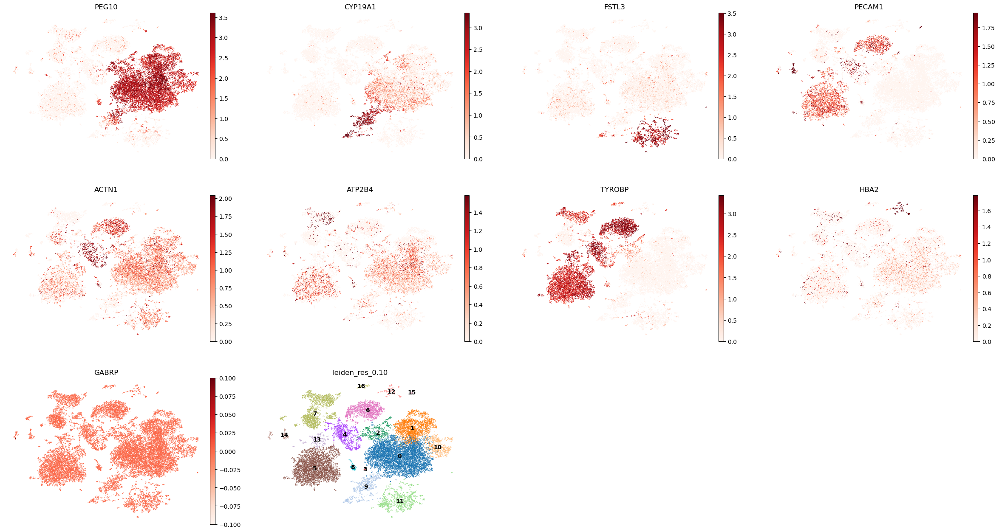

In [77]:
sc.pl.umap(   
    adata,
    color=["PEG10", # "PAGE4" CTB
           "CYP19A1", # STB CELLMARKER2.0
           "FSTL3", # EVT HUMAN PROTEIN ATLAS "HLA-G"
           "PECAM1", # END https://www.frontiersin.org/journals/cardiovascular-medicine/articles/10.3389/fcvm.2019.00165/full
           "ACTN1", # SM HUMAN PROTEIN ATLAS 
           "TYROBP", # HB HUMAN PROTEIN ATLAS
           "HBA2", # MIC 
           "GABRP", # FB HUMAN PROTEIN ATLAS
           'leiden_res_0.10'], 
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

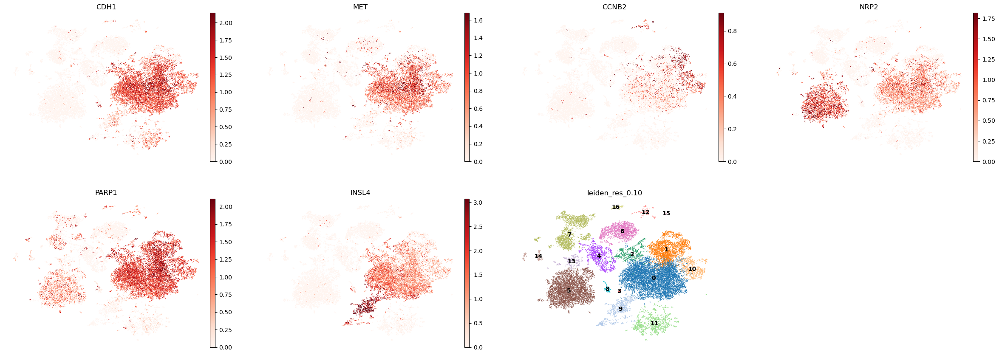

In [52]:
sc.pl.umap(   # yang CTB markers
    adata,
    color=["CDH1",
           "MET", 
           "CCNB2", 
           "NRP2", 
           "PARP1", 
           "INSL4", 
           'leiden_res_0.10'], 
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

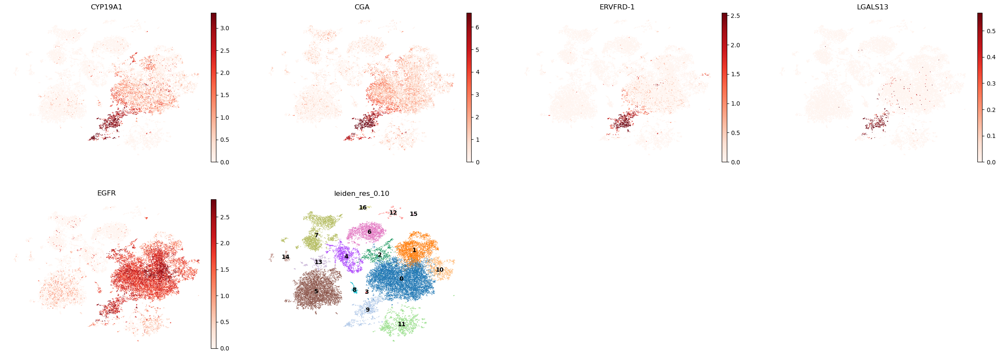

In [53]:
sc.pl.umap(   # yang STB markers
    adata,
    color=["CYP19A1",
           "CGA", 
           "ERVFRD-1", 
           "LGALS13", 
           "EGFR", 
           'leiden_res_0.10'], 
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

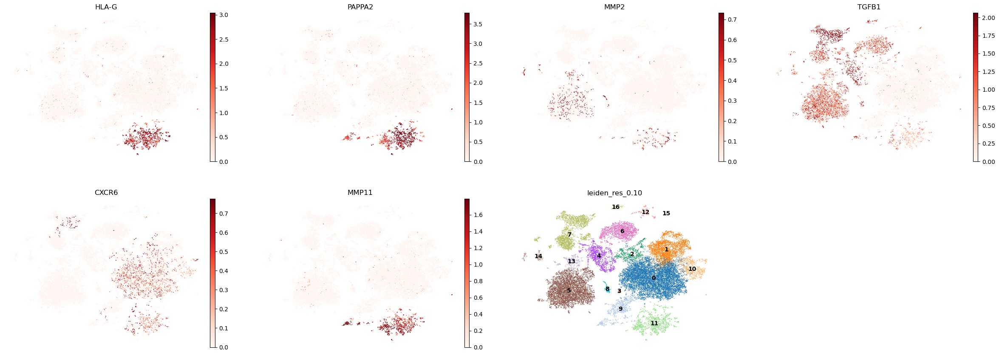

In [54]:
sc.pl.umap(   # yang EVT markers
    adata,
    color=["HLA-G",
           "PAPPA2", 
           "MMP2", 
           "TGFB1", 
           "CXCR6",
           "MMP11",
           'leiden_res_0.10'], 
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

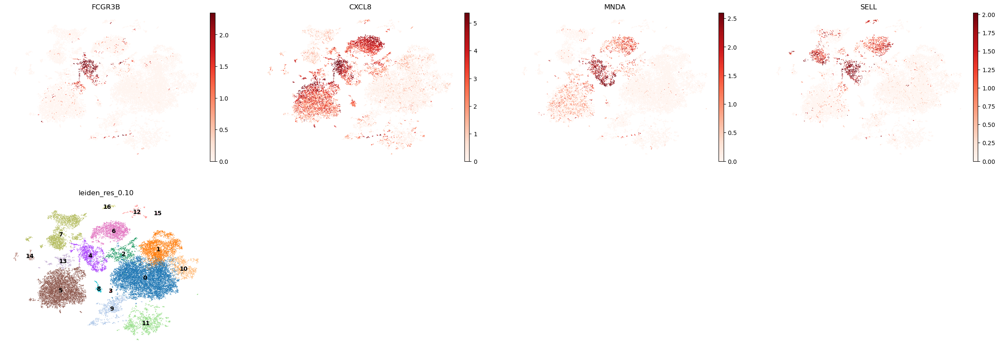

In [55]:
sc.pl.umap(   # yang GRANULOCYTE markers
    adata,
    color=["FCGR3B",
           "CXCL8", 
           "MNDA", 
           "SELL", 
           'leiden_res_0.10'], 
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

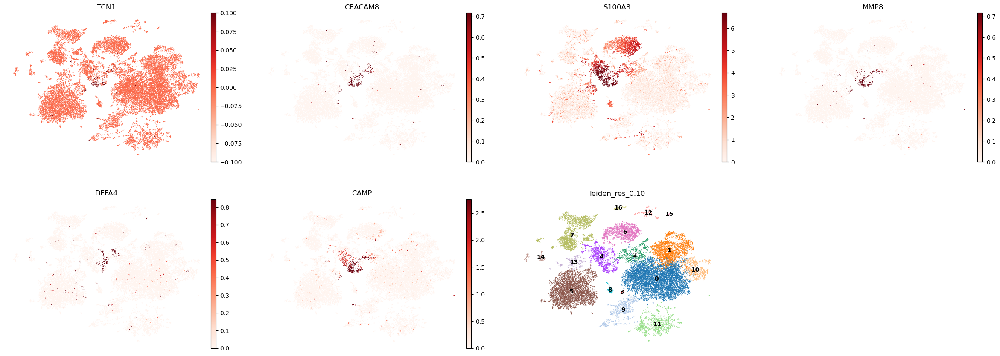

In [56]:
sc.pl.umap(   # yang MYE markers
    adata,
    color=["TCN1",
           "CEACAM8", 
           "S100A8", 
           "MMP8", 
           "DEFA4", 
           "CAMP", 
           'leiden_res_0.10'], 
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

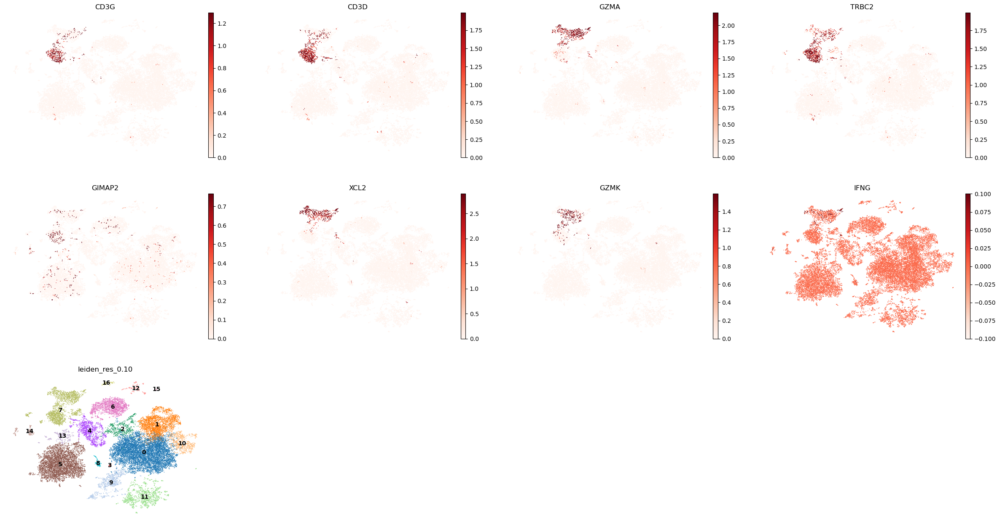

In [57]:
sc.pl.umap(   # yang T/NK markers
    adata,
    color=["CD3G",
           "CD3D", 
           "GZMA", 
           "TRBC2", 
           "GIMAP2", 
           "XCL2", 
           "GZMK", 
           "IFNG", 
           'leiden_res_0.10'], 
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)


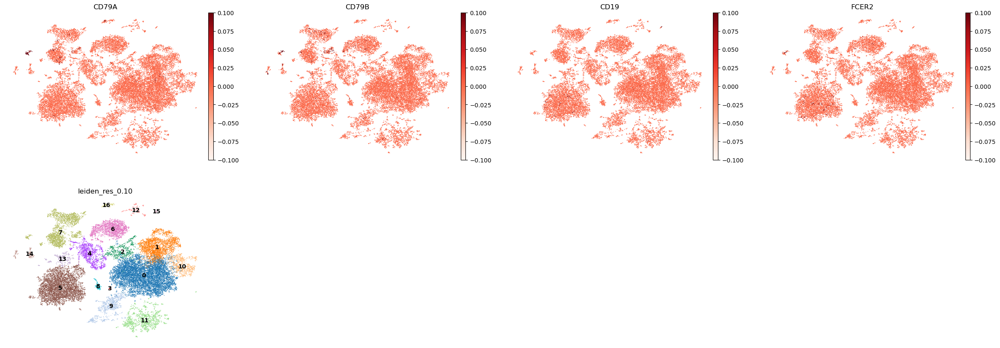

In [58]:
sc.pl.umap(   # Bcell markers
    adata,
    color=["CD79A",
           "CD79B", 
           "CD19", 
           "FCER2", 
           'leiden_res_0.10'], 
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

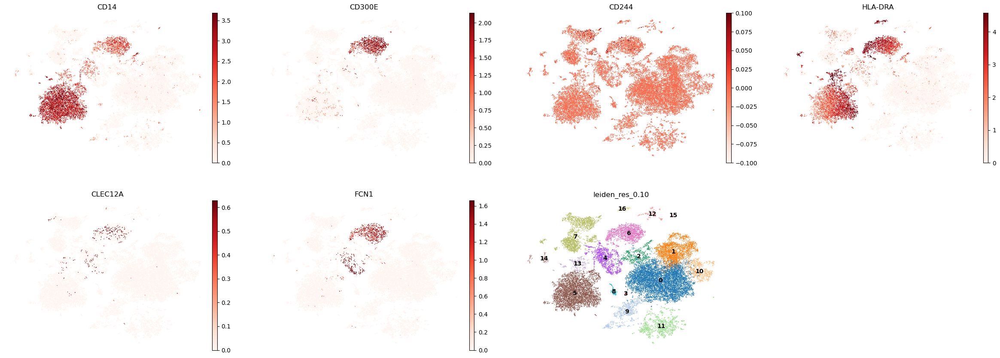

In [59]:
sc.pl.umap(   # MONOCYTE markers
    adata,
    color=["CD14",
           "CD300E", 
           "CD244", 
           "HLA-DRA", 
           "CLEC12A", 
           "FCN1", 
           'leiden_res_0.10'], 
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

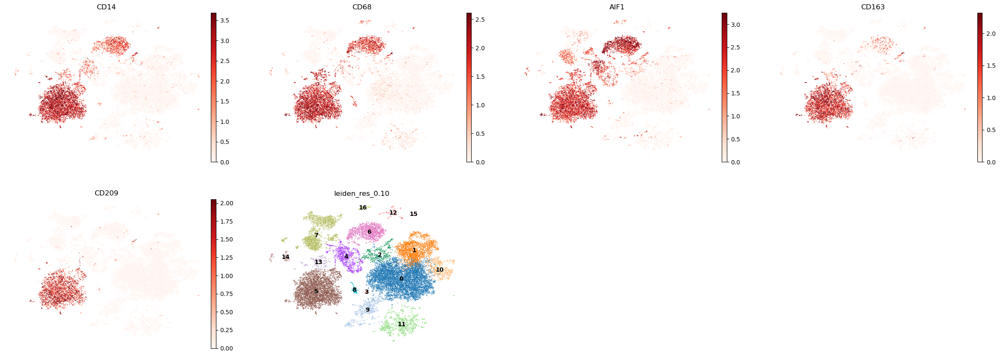

In [61]:
sc.pl.umap(   # macrophage markers
    adata,
    color=["CD14",
           "CD68", 
           "AIF1", 
           "CD163", 
           "CD209", 
           #"CSFIR", 
           'leiden_res_0.10'], 
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

In [78]:
# create a dictionary to map cluster to annotation label
celltype = {
     '0': 'CTB', # HPA; yang
     '1': 'CTB', # HPA; yang
     '2': 'CTB', # HPA; yang
     '3': 'CTB', #  yang
     '4': 'HB', # HB HPA ; yang (GRAN)
     '5': 'HB',#  HB HPA; yang MYE (monocyte)
     '6': 'HB', # yang(monocyte)
     '7': 'MIC', # HPA; yang (T/NK)
     '8': 'SM', # HPA
     '9': 'STB', # HPA; yang
    '10': 'CTB', # yang
    '11': 'EVT', # HPA ; yang
    '12': 'MIC', # HPA
    '13': 'HB', # HPA
    '14': 'END', # HPA
    '15': 'END', # HPA
    '16': 'MIC', # HPA
}

# add a new `.obs` column called `cell_type` by mapping clusters to annotation using pandas `map` function
adata.obs['cell_type'] = adata.obs['leiden_res_0.10'].map(celltype).astype('category')

In [79]:
# create a dictionary to map cluster to annotation label
uniquecelltype = {
     '0': 'CTB_1', # HPA; yang
     '1': 'CTB_2', # HPA; yang
     '2': 'CTB_3', # HPA; yang
     '3': 'CTB_4', #  yang
     '4': 'HB_1', # HB HPA ; yang (GRAN)
     '5': 'HB_2',#  HB HPA; yang MYE (monocyte)
     '6': 'HB_3', # yang(monocyte)
     '7': 'MIC_1', # HPA; yang (T/NK)
     '8': 'SM_1', # HPA
     '9': 'STB_1', # HPA; yang
    '10': 'CTB_5', # yang
    '11': 'EVT_1', # HPA ; yang
    '12': 'MIC_2', # HPA
    '13': 'HB_4', # HPA
    '14': 'END_1', # HPA
    '15': 'END_2', # HPA
    '16': 'MIC_3', # HPA
}

# add a new `.obs` column called `unique_cell_type` by mapping clusters to annotation using pandas `map` function
adata.obs['unique_cell_type'] = adata.obs['leiden_res_0.10'].map(uniquecelltype).astype('category')

In [80]:
adata.obs

,Author,BioSample,Run,Tissue,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,...,log1p_total_counts_mt,pct_counts_mt,n_genes,doublet_score,predicted_doublet,leiden_res_0.14,leiden_res_0.10,leiden_res_0.09,cell_type,unique_cell_type
CellID,,,,,,,,,,,,,,,,,,,,,
SRR14309761:AAAGTCCCATGAATAGx,Yang_2021,SAMN18844857,SRR14309761,placenta,588,6.378426,854.0,6.751101,27.517564,40.281030,...,0.0,0.0,588,0.034509,False,0,0,0,CTB,CTB_1
SRR14309761:AACAAGATCAACCTCCx,Yang_2021,SAMN18844857,SRR14309761,placenta,661,6.495266,1697.0,7.437206,50.618739,60.400707,...,0.0,0.0,661,0.006639,False,3,4,2,HB,HB_1
SRR14309761:AAAGGTACATCGCTGGx,Yang_2021,SAMN18844857,SRR14309761,placenta,2086,7.643483,5302.0,8.576028,29.743493,38.098831,...,0.0,0.0,2086,0.042290,False,4,5,3,HB,HB_2
SRR14309761:AAAGAACGTTTAGAGAx,Yang_2021,SAMN18844857,SRR14309761,placenta,1068,6.974479,2692.0,7.898411,35.624071,47.251114,...,0.0,0.0,1068,0.012388,False,5,6,4,HB,HB_3
SRR14309761:AAAGTGAAGTGGACGTx,Yang_2021,SAMN18844857,SRR14309761,placenta,687,6.533789,1295.0,7.167038,34.208494,47.567568,...,0.0,0.0,687,0.018061,False,0,1,0,CTB,CTB_2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR14309755:TTTGGAGAGTTCACTGx,Yang_2021,SAMN18844863,SRR14309755,placenta,2078,7.639642,4924.0,8.502080,26.015435,36.230707,...,0.0,0.0,2078,0.029881,False,0,1,0,CTB,CTB_2
SRR14309755:TTTGTTGTCATTGCGAx,Yang_2021,SAMN18844863,SRR14309755,placenta,2313,7.746733,7236.0,8.886962,26.976230,38.557214,...,0.0,0.0,2313,0.098718,False,1,0,0,CTB,CTB_1
SRR14309755:TTTCACAGTTTCGACAx,Yang_2021,SAMN18844863,SRR14309755,placenta,2845,7.953670,9508.0,9.159994,26.556584,37.852335,...,0.0,0.0,2845,0.029277,False,1,0,0,CTB,CTB_1


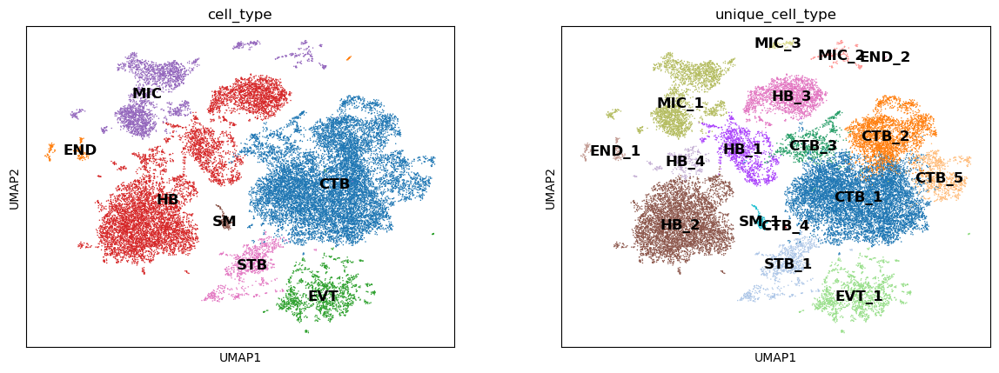

In [81]:
sc.pl.umap(adata, color=['cell_type','unique_cell_type'], legend_loc='on data', legend_fontsize=12)

In [82]:
adata.write_h5ad('yang_24.06_annotated.h5ad')

In [83]:
mitogenes = pd.read_csv("MitoCarta_genesonly.csv")["Symbol"].tolist()

In [84]:
# Create a boolean column in adata.var for mito_gene
adata.var["mito_gene"] = adata.var_names.str.split(".").str[0].isin(mitogenes)
adata.var

,Accession,Chromosome,End,Start,Strand,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,mito_gene
Gene,,,,,,,,,,,,,,,,,,,,
AC145212.1,ENSG00000277400,GL000194.1,115018,53590,-,False,62,0.001327,0.001326,99.871460,64.0,4.174387,62,False,0.002027,0.095039,-0.491973,0,False,False
MAFIP,ENSG00000274847,GL000194.1,115055,53594,-,False,3,0.000062,0.000062,99.993780,3.0,1.386294,3,False,0.000080,-0.264390,-0.973851,0,False,False
AC011043.1,ENSG00000276256,GL000195.1,49164,42939,-,False,876,0.019488,0.019301,98.183854,940.0,6.846943,871,False,0.021168,0.256514,-0.243552,0,False,False
AL592183.1,ENSG00000273748,GL000219.1,83311,54224,-,False,742,0.016192,0.016062,98.461666,781.0,6.661855,718,False,0.025060,0.745227,0.400100,0,False,False
AC240274.1,ENSG00000271254,KI270711.1,29626,4612,-,False,694,0.015135,0.015021,98.561181,730.0,6.594413,679,False,0.023272,0.300311,-0.200680,0,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VBP1,ENSG00000155959,X,155239841,155197007,+,False,7761,0.228470,0.205769,83.909690,11020.0,9.307558,7319,False,0.250576,0.528542,-0.139400,0,False,False
SPRY3,ENSG00000168939,X,155782459,155767812,+,False,83,0.001742,0.001740,99.827922,84.0,4.442651,49,False,0.002300,0.791153,0.522097,0,False,False
VAMP7,ENSG00000124333,X,155943769,155881345,+,False,3873,0.093088,0.089007,91.970394,4490.0,8.409831,3694,False,0.124205,0.559845,0.130757,0,False,False


In [86]:
adata.obs.to_csv("yang_obs.csv")
adata.var.to_csv("yang_var.csv")
adata.to_df().to_csv("yang_X.csv")